In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, savemat
import pandas as pd
import scipy.special as SS
import scipy.stats as SSA
import copy
import random
import math
from sklearn.model_selection import ParameterGrid
import os
import numpy.linalg as LA
import gzip

# load pickle module
import pickle

In [176]:
R0 = 2.5
rs = np.array([20, 10., 2, 1, 0.5, 0.2, 0.1, 0.05, 0.025])
export_dir = '../../../../../../Volumes/My Passport/branching/R025/'
for r_idx in range(5,6):
    r = rs[r_idx]
    print(r)
    export_names = export_dir+'NewInf_R0-{}_r-{}.npy'.format(np.round(R0,2),np.round(r,2))
    En_NewInf = np.load(export_names)  
    ### select the ensembles in which the dieases does not die out
    valid_en = np.unique(np.where(En_NewInf[:,:,59]>1)[0])
    En_NewInf = En_NewInf[valid_en,:,:]

0.2


In [177]:
En_NewInf[En_NewInf == 0] = 0.000000000000001
log_i = np.log(En_NewInf) 

In [137]:
log_data = log_i[:,1858,59]

mu = np.mean(log_data)
sigma = np.std(log_data)

# The shape parameter for the lognormal distribution is the standard deviation of the log-transformed data
shape = sigma

# The scale parameter for the lognormal distribution is e^mu
scale = np.exp(mu)

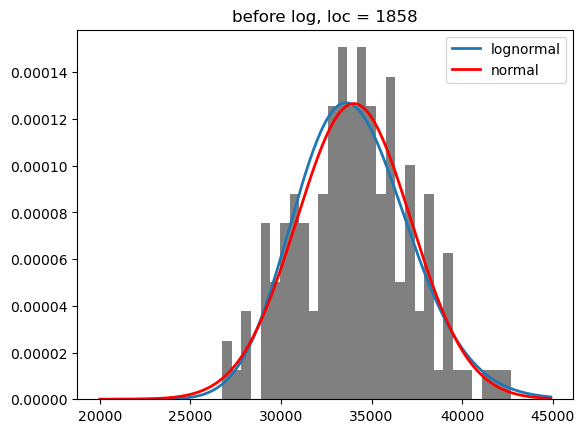

In [138]:
temp2 = En_NewInf[:,1858,59]
plt.hist(temp2[temp2>1],density=True,color='grey',bins=30)
x = np.arange(20000,45000,100)
y = SSA.lognorm.pdf(x, s=sigma, scale=scale,loc=0)
plt.plot(x,y,label='lognormal',lw=2)

y2 = SSA.norm.pdf(x, scale=np.std(temp2),loc=np.mean(temp2))
plt.plot(x,y2,label='normal',lw=2,color='red')

plt.title('before log, loc = 1858')
plt.legend()

Text(0.5, 1.0, 'after log, loc = 1858')

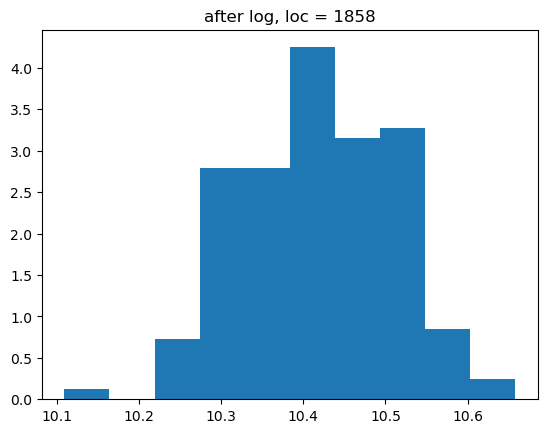

In [110]:
temp = log_i[:,1858,59]
plt.hist(temp,density=True)
plt.title('after log, loc = 1858')

Text(0.5, 1.0, 'before log, loc = 308')

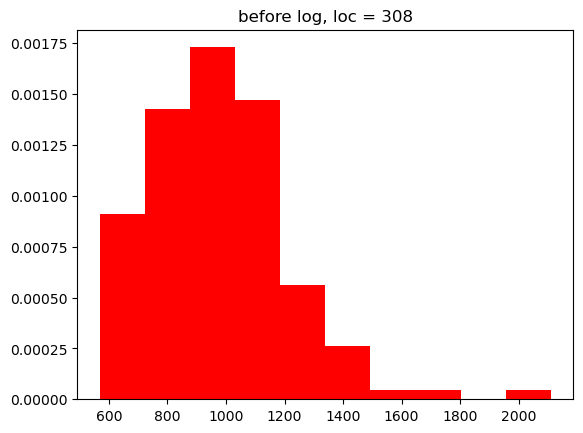

In [144]:
temp2 = En_NewInf[:,1776,59]
plt.hist(temp2[temp2>1],density=True,color='red')
plt.title('before log, loc = 308')

Text(0.5, 1.0, 'after log, loc = 308')

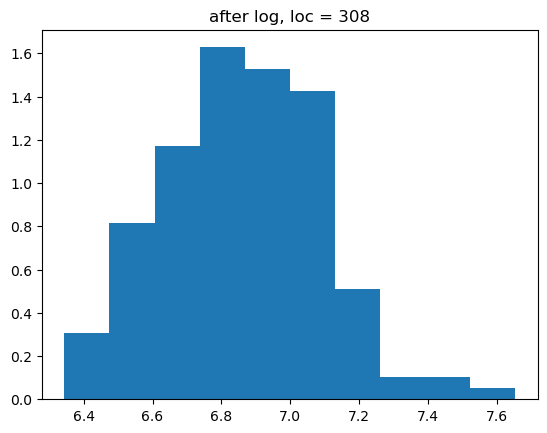

In [145]:
temp = log_i[:,1776,59]
plt.hist(temp[temp>-10],density=True)
plt.title('after log, loc = 308')

In [158]:
locations = np.array([ 308,  309,  310,  312, 1775, 1776, 1777, 1780, 1782, 1783, 1784,
        1785, 1786, 1787, 1788, 1789, 1791, 1792, 1793, 1794, 1830, 1841,
        1851, 1857, 1858, 1863, 1867, 1868, 1870, 1871, 1879, 1883, 1887,
        2252, 2289, 2294])

In [178]:
plt.figure(figsize=(36, 15),dpi=450)
for l_idx in range(36):
    l = locations[l_idx]
    print(l)
    log_data = log_i[:,l,59]
    mu = np.mean(log_data)
    sigma = np.std(log_data)
    # The shape parameter for the lognormal distribution is the standard deviation of the log-transformed data
    shape = sigma
    # The scale parameter for the lognormal distribution is e^mu
    scale = np.exp(mu)
    
    temp2 = En_NewInf[:,l,59]
    
    axs_i = plt.subplot(3,12,l_idx+1)
    
    plt.hist(temp2[temp2>1],density=True,color='grey',bins=20)
    x_left = np.min(temp2[temp2>1])
    x_right = np.max(temp2[temp2>1])
    x = np.arange(x_left,x_right,10)
    y = SSA.lognorm.pdf(x, s=sigma, scale=scale,loc=0)
    plt.plot(x,y,label='lognormal',lw=1)

    y2 = SSA.norm.pdf(x, scale=np.std(temp2),loc=np.mean(temp2))
    plt.plot(x,y2,label='normal',lw=1,color='red')
    
    plt.title('before log, loc = {}'.format(l))
plt.legend()

308
309
310
312
1775
1776
1777
1780
1782
1783
1784
1785
1786
1787
1788
1789
1791
1792
1793
1794
1830
1841
1851
1857
1858
1863
1867
1868
1870
1871
1879
1883
1887
2252
2289
2294


In [181]:
R0 = 2.1
r_i = 0.19 
save_dir = '../../../../../../Volumes/My Passport/branching/branching_results500/'

file_name1 = save_dir + "NewInf_R0-{}_r-{}.npy.gz" .format(np.round(R0,2),np.round(r_i,2))
f1 = gzip.GzipFile(file_name1, "r")
En_NewInf =  np.load(f1)
    
En_NewInf[En_NewInf == 0] = 0.000000000000001
log_i = np.log(En_NewInf)    


In [182]:
plt.figure(figsize=(36, 15),dpi=450)
for l_idx in range(36):
    l = locations[l_idx]
    print(l)
    log_data = log_i[:,l,59]
    mu = np.mean(log_data)
    sigma = np.std(log_data)
    # The shape parameter for the lognormal distribution is the standard deviation of the log-transformed data
    shape = sigma
    # The scale parameter for the lognormal distribution is e^mu
    scale = np.exp(mu)
    
    temp2 = En_NewInf[:,l,59]
    
    axs_i = plt.subplot(3,12,l_idx+1)
    
    plt.hist(temp2[temp2>1],density=True,color='grey',bins=20)
    x_left = np.min(temp2[temp2>1])
    x_right = np.max(temp2[temp2>1])
    x = np.arange(x_left,x_right,10)
    y = SSA.lognorm.pdf(x, s=sigma, scale=scale,loc=0)
    plt.plot(x,y,label='lognormal',lw=1)

    y2 = SSA.norm.pdf(x, scale=np.std(temp2),loc=np.mean(temp2))
    plt.plot(x,y2,label='normal',lw=1,color='red')
    
    plt.title('before log, loc = {}'.format(l))
plt.legend()

308
309
310
312
1775
1776
1777
1780
1782
1783
1784
1785
1786
1787
1788
1789
1791
1792
1793
1794
1830
1841
1851
1857
1858
1863
1867
1868
1870
1871
1879
1883
1887
2252
2289
2294
